# Capstone Project — The Battle of Neighbourhoods

# Introduction
New Delhi is the capital city of India. It is a part of the city of Delhi’s 11 districts. The city itself has a population of 257,803. However, the much larger metro area has a population that exceeds 26 million.

New Delhi are used interchangeably to refer to the National Capital Territory of Delhi (NCT), these are two distinct entities, with New Delhi forming a small part of Delhi. The National Capital Region is a much larger entity comprising the entire NCT along with adjoining districts in neighboring states.

The official language of New Delhi and the one that is most widely spoken is Hindi. However, English is also spoken as a formal language within businesses and government agencies. Over last decades it is continuously grow because of the city’s important role in government and commercial business.

With it’s diverse culture , comes diverse food items. There are many restaurants in New Delhi City, each belonging to different categories like Chinese , Italian , French etc. So as part of this project , we will list and visualise all major parts of New Delhi City .

## Questions that can be asked using the above mentioned datasets
What is best location in New Delhi City for Chinese Cuisine ?
Which areas have large number of Chinese Resturant Market ?
Which all areas have less number of resturant ?
Which is the best place to stay if I prefer Chinese Cuisine ?
What places are have best restaurant in New Delhi?

# Data
For this project we need the following data :

New Delhi Resturants data that contains list Locality, Resturant name,Rating along with their latitude and longitude.
Data source : Zomato kaggel dataset
Description : This data set contains the required information. And we will use this data set to explore various locality of new delhi city.
Nearby places in each locality of new delhi city.
Data source : Fousquare API
Description : By using this api we will get all the venues in each neighborhood.

# Approach
Collect the new delhi city data from Zomato kaggel dataset
Using FourSquare API we will find all venues for each neighborhood.
Filter out all venues that are nearby by locality.
Using aggregative rating for each resturant to find the best places.
Visualize the Ranking of neighborhoods using folium library(python)

In [1]:

import types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.
client_c3420dad75c6420e8623f3fbcb825b77 = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='HoRPjP6x08S1-ZccLQlouWdMoE3aZrcrC_03wujjHjL-',
    ibm_auth_endpoint="https://iam.cloud.ibm.com/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url='https://s3.eu-geo.objectstorage.service.networklayer.com')

body = client_c3420dad75c6420e8623f3fbcb825b77.get_object(Bucket='myproject1-donotdelete-pr-wenp6rwajesmok',Key='zomato1.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_1 = pd.read_csv(body)
df_data_1.head()

,Unnamed: 0,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [28]:
import pandas as pd
import numpy as np
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
# import k-means from clustering stage
from sklearn.cluster import KMeans

!pip install folium==0.5.0 # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
! pip install geocoder
import geocoder

     |████████████████████████████████| 98 kB 10.4 MB/s eta 0:00:01


In [2]:
df_data_1.drop('Unnamed: 0',axis=1,inplace=True)

In [12]:

df_delhi=df_data_1[(df_data_1['Country Code']==1) & (df_data_1['City']=='New Delhi')]

In [13]:
df_delhi.reset_index(drop=True,inplace=True)

In [14]:

df_delhi.drop(df_delhi[df_delhi['Longitude']==0.0].index, inplace = True) 




/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
1,18216944,Burger.in,1,New Delhi,"84, Near Honda Showroom, Adchini, New Delhi",Adchini,"Adchini, New Delhi",77.196923,28.535382,Fast Food,...,Indian Rupees(Rs.),No,Yes,No,No,1,3.2,Orange,Average,46
2,313333,Days of the Raj,1,New Delhi,"81/3, 1st Floor, Qutub Residency, Adchini, New...",Adchini,"Adchini, New Delhi",77.197475,28.535493,"North Indian, Seafood, Continental",...,Indian Rupees(Rs.),Yes,Yes,No,No,3,3.4,Orange,Average,45
3,18384127,Dilli Ka Dhaba,1,New Delhi,"66 A, Ground Floor, Sri Aurobindo Marg, Adchin...",Adchini,"Adchini, New Delhi",77.198033,28.537547,"South Indian, North Indian",...,Indian Rupees(Rs.),No,No,No,No,2,2.6,Orange,Average,11
4,582,Govardhan,1,New Delhi,"84, Adjacent Hero Motor Bike Showroom, Main Me...",Adchini,"Adchini, New Delhi",77.196924,28.535523,"South Indian, North Indian, Chinese",...,Indian Rupees(Rs.),No,Yes,No,No,2,3.4,Orange,Average,238
5,18414465,Mezbaan Grills,1,New Delhi,"A- 96, Shri Aurbindo Marg, Adchini, New Delhi",Adchini,"Adchini, New Delhi",77.198122,28.538134,Mughlai,...,Indian Rupees(Rs.),No,No,No,No,1,3.1,Orange,Average,8


In [42]:
df_delhi = df_delhi[df_delhi['Aggregate rating'] !=0.0]


In [18]:
df_delhi=df_delhi[['Restaurant Name','Locality','Longitude','Latitude','Cuisines','Aggregate rating','Rating text','Votes']]

In [19]:
df_delhi.head()

,Restaurant Name,Locality,Longitude,Latitude,Cuisines,Aggregate rating,Rating text,Votes
1,Burger.in,Adchini,77.196923,28.535382,Fast Food,3.2,Average,46
2,Days of the Raj,Adchini,77.197475,28.535493,"North Indian, Seafood, Continental",3.4,Average,45
3,Dilli Ka Dhaba,Adchini,77.198033,28.537547,"South Indian, North Indian",2.6,Average,11
4,Govardhan,Adchini,77.196924,28.535523,"South Indian, North Indian, Chinese",3.4,Average,238
5,Mezbaan Grills,Adchini,77.198122,28.538134,Mughlai,3.1,Average,8


In [30]:
New_Delhi_Rest = folium.Map(location=[28.52, 77.25], zoom_start=12)

X = df_delhi['Latitude']
Y = df_delhi['Longitude']
Z = np.stack((X, Y), axis=1)

kmeans = KMeans(n_clusters=5, random_state=0).fit(Z)

clusters = kmeans.labels_
colors = ['red', 'green', 'blue', 'yellow','orange']
df_delhi ['Cluster'] = clusters

for latitude, longitude, Locality, cluster in zip(df_delhi['Latitude'], df_delhi['Longitude'], df_delhi['Locality'], df_delhi['Cluster']):
    label = folium.Popup(Locality, parse_html=True)
    folium.CircleMarker(
        [latitude, longitude],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color=colors[cluster],
        fill_opacity=0.7).add_to(New_Delhi_Rest)  

New_Delhi_Rest

# What places are have best restaurant in New Delhi?

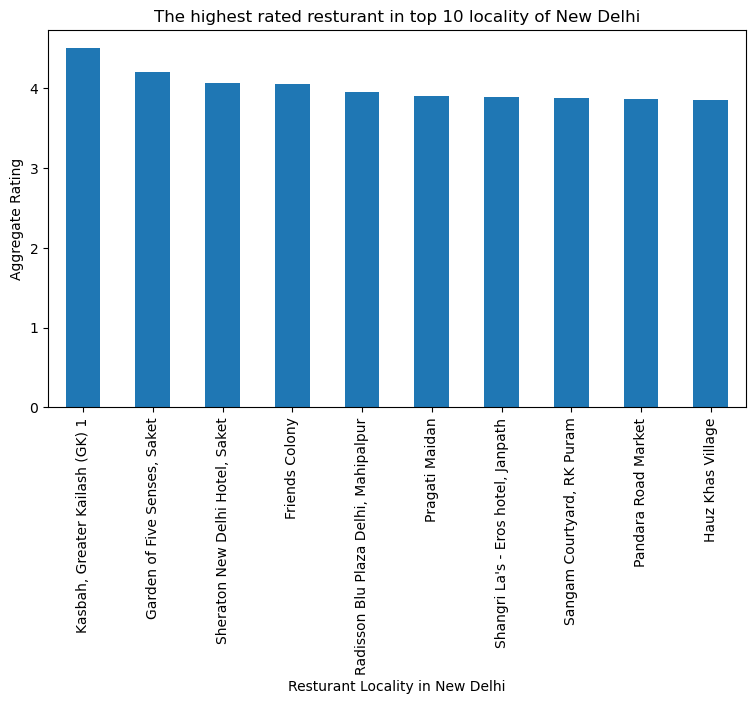

In [31]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The highest rated resturant in top 10 locality of New Delhi')
#On x-axis

#giving a bar plot
df_delhi.groupby('Locality')['Aggregate rating'].mean().nlargest(10).plot(kind='bar')

plt.xlabel('Resturant Locality in New Delhi')
#On y-axis
plt.ylabel('Aggregate Rating')
#displays the plot
plt.show()

The best restarants are available in Kesbah, Greater Kailash area.

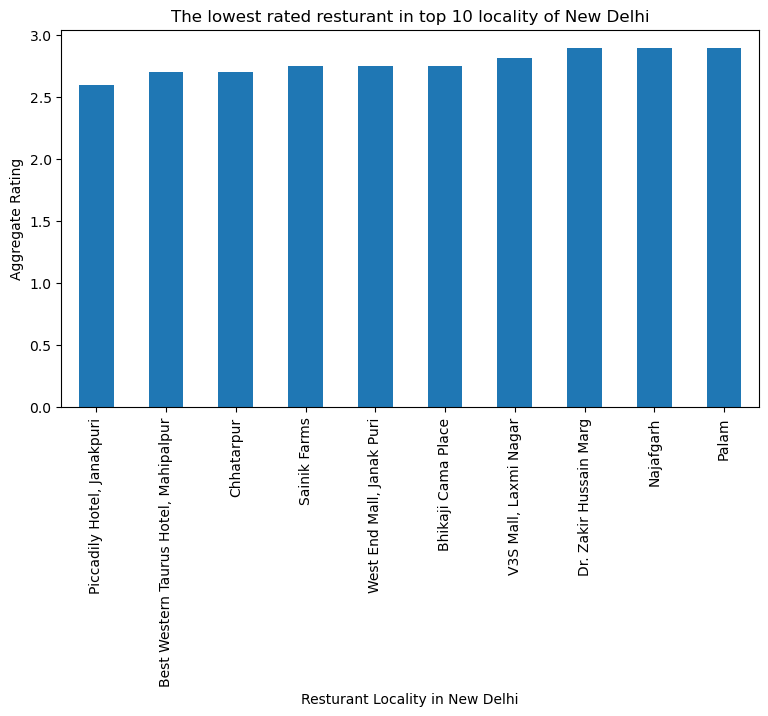

In [44]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The lowest rated resturant in top 10 locality of New Delhi')
#On x-axis

#giving a bar plot
df_delhi.groupby('Locality')['Aggregate rating'].mean().nsmallest(10).plot(kind='bar')

plt.xlabel('Resturant Locality in New Delhi')
#On y-axis
plt.ylabel('Aggregate Rating')
#displays the plot
plt.show()

The worst restarants are available in Piccadily Hotel, Janakpuri.


# Which place are suitable for edible person in New Delhi city?

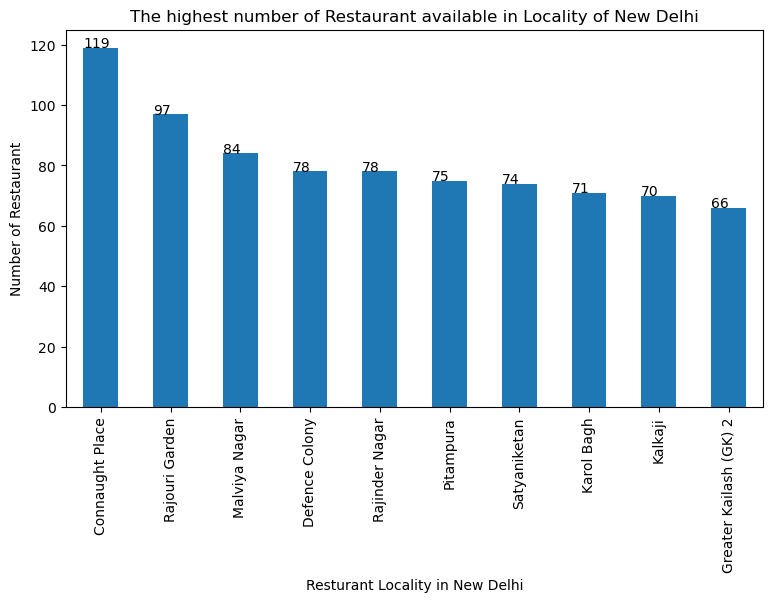

In [49]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The highest number of Restaurant available in Locality of New Delhi')
#On x-axis

#giving a bar plot
ax=df_delhi.groupby('Locality')['Restaurant Name'].count().nlargest(10).plot(kind='bar')

plt.xlabel('Resturant Locality in New Delhi')
#On y-axis
plt.ylabel('Number of Restaurant')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height() ))
#displays the plot
plt.show()

Connaught Place is the best places for edible person to stay there.

# Which place are not suitable for edible person in New Delhi city?

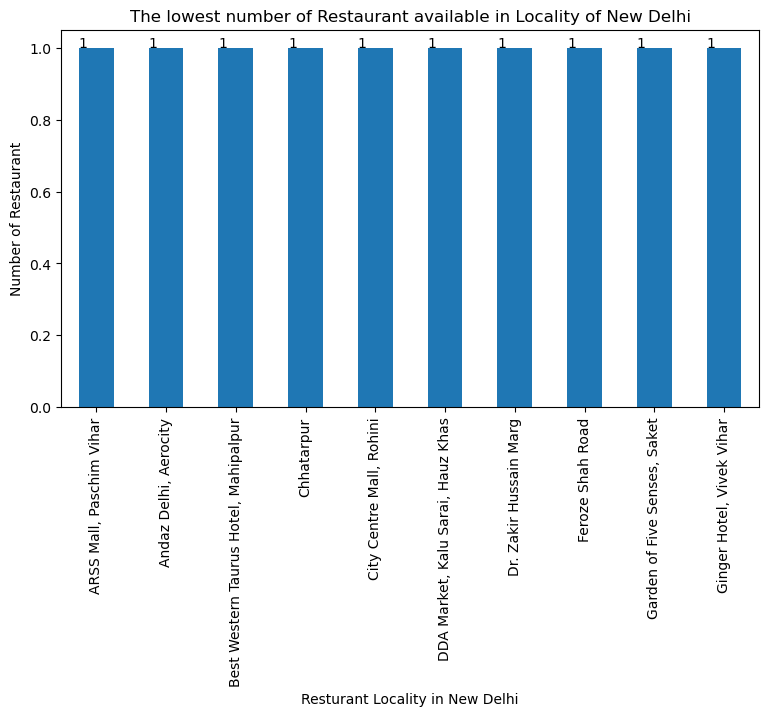

In [51]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The lowest number of Restaurant available in Locality of New Delhi')
#On x-axis

#giving a bar plot
ax=df_delhi.groupby('Locality')['Restaurant Name'].count().nsmallest(10).plot(kind='bar')

plt.xlabel('Resturant Locality in New Delhi')
#On y-axis
plt.ylabel('Number of Restaurant')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height() ))
#displays the plot
plt.show()

# What are the best places for chinese restaurant in New Delhi city¶

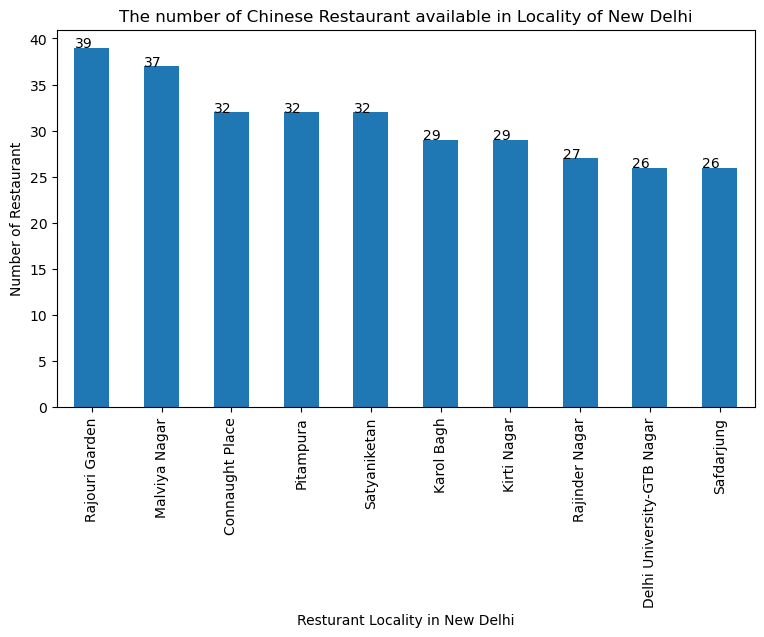

In [56]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('The number of Chinese Restaurant available in Locality of New Delhi')
#On x-axis

#giving a bar plot
ax=df_delhi[df_delhi['Cuisines'].str.contains('Chinese')].groupby('Locality')['Restaurant Name'].count().nlargest(10).plot(kind='bar')

plt.xlabel('Resturant Locality in New Delhi')
#On y-axis
plt.ylabel('Number of Restaurant')

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x(), p.get_height() ))
#displays the plot
plt.show()

# Data transformation


Based on Locality grouping the data

In [61]:
df_delhi_Loc =  df_delhi.groupby('Locality').count()['Restaurant Name'].to_frame()
df_delhi_rating= df_delhi.groupby('Locality')['Aggregate rating'].mean().to_frame()
d_Cuisines = df_delhi.groupby(['Locality'])['Cuisines'].agg(', '.join).reset_index()
d_R = df_delhi.groupby(['Locality'])['Rating text'].unique().agg(', '.join).reset_index()
d_V = df_delhi.groupby(['Locality'])['Votes'].sum().to_frame()
d_Lat = df_delhi.groupby('Locality').mean()['Latitude'].to_frame()
d_Lng = df_delhi.groupby('Locality').mean()['Longitude'].to_frame()
df_final = pd.merge(d_Lat,d_Lng,on='Locality').merge(df_delhi_Loc, on='Locality').merge(d_Cuisines, on='Locality').merge(df_delhi_rating,on ='Locality').merge(d_R, on ='Locality').merge(d_V, on ='Locality')

In [63]:
df_final = df_final[df_final['Aggregate rating'] != 0.000000]
df_final.columns =['Locality','Lat','Lng', 'No_of_Restaurant','Cusines', 'Agg_Rating','Comments' ,'No_of_Votes']
df_final.head()

,Locality,Lat,Lng,No_of_Restaurant,Cusines,Agg_Rating,Comments,No_of_Votes
0,"ARSS Mall, Paschim Vihar",28.668945,77.101544,1,"North Indian, South Indian, Chinese, Mithai, F...",3.100000,Average,117
1,Adchini,28.537063,77.197808,13,"Fast Food, North Indian, Seafood, Continental,...",3.292308,"Average, Good, Poor, Very Good",1560
2,"Aditya Mega Mall, Karkardooma",28.656131,77.301266,4,"Finger Food, North Indian, Mughlai, Pizza, Fas...",3.275000,"Average, Good",434
3,Aerocity,28.553076,77.104270,2,"Fast Food, Italian, Pizza, North Indian, Conti...",3.200000,Average,59
4,"Aggarwal City Mall, Pitampura",28.690020,77.134650,3,"North Indian, Chinese, Street Food, Mithai, No...",3.033333,Average,126


# Define Foursquare Credentials and Version

In [64]:
CLIENT_ID = 'XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX' # your Foursquare ID
CLIENT_SECRET = 'XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX' # your Foursquare Secret
ACCESS_TOKEN = 'XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX' # your FourSquare Access Token
VERSION = '20180604'
LIMIT = 30
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 3GOKG3DIXERZCPOSNIUJNQVTH4J3FYPT0G4KJPERHA3VTDCA
CLIENT_SECRET:GNWRHDFPRHUBYY11M2253OJBHZK51SOX2US5DCOZWZFADDUO


In [65]:
def getNearbyVenues(names, latitudes, longitudes, radius=500,LIMIT = 100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Locality', 
                  'Locality Latitude', 
                  'Locality Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

# find the venues in all New Delhi Locality

In [66]:
new_Delhi_venues = getNearbyVenues(names=df_final['Locality'],
                                   latitudes=df_final['Lat'],
                                   longitudes=df_final['Lng']
                                  )

ARSS Mall, Paschim Vihar
Adchini
Aditya Mega Mall, Karkardooma
Aerocity
Aggarwal City Mall, Pitampura
Aggarwal City Plaza, Rohini
Alaknanda
Ambience Mall, Vasant Kunj
Anand Lok
Anand Vihar
Andaz Delhi, Aerocity
Ansal Plaza Mall, Khel Gaon Marg
Asaf Ali Road
Ashok Vihar Phase 1
Ashok Vihar Phase 2
Ashok Vihar Phase 3
Barakhamba Road
Basant Lok Market, Vasant Vihar
Bellagio, Ashok Vihar Phase 2
Best Western Taurus Hotel, Mahipalpur
Bhikaji Cama Place
Chanakyapuri
Chander Nagar
Chandni Chowk
Chawri Bazar
Chhatarpur
Chittaranjan Park
City Centre Mall, Rohini
City Square Mall, Rajouri Garden
Civil Lines
Community Centre, New Friends Colony
Connaught Place
Crescent Square Mall, Rohini
Cross River Mall, Karkardooma
Crowne Plaza Hotel, Rohini
Crowne Plaza, Mayur Vihar Phase 1
D Mall, Netaji Subhash Place
DDA Market, Kalu Sarai, Hauz Khas
DLF City Centre Mall, Shalimar Bagh
DLF Emporio Mall, Vasant Kunj
DLF Place Mall, Saket
DLF Promenade Mall, Vasant Kunj
DLF South Square, Sarojini Nagar
Darya

In [67]:
new_Delhi_venues.head()


,Locality,Locality Latitude,Locality Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"ARSS Mall, Paschim Vihar",28.668945,77.101544,Subway,28.669999,77.102546,Sandwich Place
1,"ARSS Mall, Paschim Vihar",28.668945,77.101544,Pizza Hut,28.670321,77.103853,Pizza Place
2,"ARSS Mall, Paschim Vihar",28.668945,77.101544,Café Coffee Day,28.670009,77.102480,Coffee Shop
3,"ARSS Mall, Paschim Vihar",28.668945,77.101544,Baljeet's Amritsari Koolcha,28.665768,77.100481,Indian Restaurant
4,"ARSS Mall, Paschim Vihar",28.668945,77.101544,Little Chef,28.670000,77.101459,Chinese Restaurant


In [68]:
new_Delhi_venues.groupby('Locality').count()


,Locality Latitude,Locality Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Locality,,,,,,
"ARSS Mall, Paschim Vihar",9,9,9,9,9,9
Adchini,6,6,6,6,6,6
"Aditya Mega Mall, Karkardooma",10,10,10,10,10,10
Aerocity,7,7,7,7,7,7
"Aggarwal City Mall, Pitampura",4,4,4,4,4,4
...,...,...,...,...,...,...
"West Gate Mall, Rajouri Garden",18,18,18,18,18,18
West Patel Nagar,4,4,4,4,4,4
"Worldmark 1, Aerocity",30,30,30,30,30,30


In [69]:
## Analyze Each Locality

# one hot encoding
new_Delhi_onehot = pd.get_dummies(new_Delhi_venues[['Venue Category']], prefix="", prefix_sep="")

# add Locality column back to dataframe
new_Delhi_onehot['Locality'] = new_Delhi_venues['Locality'] 

# move Locality column to the first column
column_list = new_Delhi_onehot.columns.tolist()
column_number = int(column_list.index('Locality'))
column_list = [column_list[column_number]] + column_list[:column_number] + column_list[column_number+1:]
new_Delhi_onehot = new_Delhi_onehot[column_list]

new_Delhi_onehot.head()

,Locality,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,...,Toy / Game Store,Trail,Train Station,Turkish Restaurant,Udupi Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wings Joint,Women's Store
0,"ARSS Mall, Paschim Vihar",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,"ARSS Mall, Paschim Vihar",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"ARSS Mall, Paschim Vihar",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,"ARSS Mall, Paschim Vihar",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,"ARSS Mall, Paschim Vihar",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [70]:
New_Delhi_grouped = new_Delhi_onehot.groupby('Locality').mean().reset_index()
New_Delhi_grouped

,Locality,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,...,Toy / Game Store,Trail,Train Station,Turkish Restaurant,Udupi Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wings Joint,Women's Store
0,"ARSS Mall, Paschim Vihar",0.111111,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Adchini,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,"Aditya Mega Mall, Karkardooma",0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Aerocity,0.000000,0.000000,0.0,0.0,0.0,0.142857,0.0,0.142857,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,"Aggarwal City Mall, Pitampura",0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,"West Gate Mall, Rajouri Garden",0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.055556,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
234,West Patel Nagar,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
235,"Worldmark 1, Aerocity",0.000000,0.033333,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.033333,0.0,0.0,0.0,0.0,0.0,0.0,0.0
236,Yusuf Sarai,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [71]:
New_Delhi_grouped.shape

(238, 215)

In [72]:
## print each Locality along with the top 5 most common venues

num_top_venues = 5

for hood in New_Delhi_grouped['Locality']:
    print("----"+hood+"----")
    temp = New_Delhi_grouped[New_Delhi_grouped['Locality'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----ARSS Mall, Paschim Vihar----
                venue  freq
0   Indian Restaurant  0.22
1                 ATM  0.11
2              Market  0.11
3         Coffee Shop  0.11
4  Chinese Restaurant  0.11


----Adchini----
               venue  freq
0  Indian Restaurant  0.33
1               Café  0.33
2                Pub  0.17
3        Coffee Shop  0.17
4                ATM  0.00


----Aditya Mega Mall, Karkardooma----
               venue  freq
0        Pizza Place   0.2
1  Indian Restaurant   0.2
2          Multiplex   0.2
3      Shopping Mall   0.2
4              Hotel   0.1


----Aerocity----
                  venue  freq
0                 Hotel  0.29
1           Coffee Shop  0.14
2  Fast Food Restaurant  0.14
3        Airport Lounge  0.14
4   Rental Car Location  0.14


----Aggarwal City Mall, Pitampura----
                venue  freq
0    Department Store  0.25
1         Pizza Place  0.25
2           Multiplex  0.25
3  Chinese Restaurant  0.25
4    Pedestrian Plaza  0.00


----Agga

                            venue  freq
0                     Pizza Place   0.5
1                      Food Truck   0.5
2                   Movie Theater   0.0
3              Mughlai Restaurant   0.0
4  Multicuisine Indian Restaurant   0.0


----Garden of Five Senses, Saket----
                venue  freq
0  Italian Restaurant  0.17
1                 Pub  0.17
2                Café  0.17
3    Asian Restaurant  0.17
4         Coffee Shop  0.17


----Geeta Colony----
                            venue  freq
0                    Burger Joint   1.0
1                             ATM   0.0
2                  Nightlife Spot   0.0
3              Mughlai Restaurant   0.0
4  Multicuisine Indian Restaurant   0.0


----Ginger Hotel, Vivek Vihar----
               venue  freq
0              Hotel  0.33
1          BBQ Joint  0.17
2               Café  0.17
3   Asian Restaurant  0.17
4  Indian Restaurant  0.17


----Gourmet Hub, Pashim Vihar----
               venue  freq
0        Pizza Place   0.2
1 

                venue  freq
0   Indian Restaurant  0.13
1      Clothing Store  0.07
2                 Bar  0.07
3              Lounge  0.07
4  Chinese Restaurant  0.06


----MGM Club, Daryaganj----
               venue  freq
0  Indian Restaurant  0.33
1         Restaurant  0.33
2              Hotel  0.17
3               Road  0.17
4                ATM  0.00


----Mahipalpur----
               venue  freq
0              Hotel  0.31
1         Shoe Store  0.08
2    Bed & Breakfast  0.08
3  Accessories Store  0.08
4              Plaza  0.08


----Maidens Hotel, Civil Lines----
                venue  freq
0  Light Rail Station  0.29
1   Indian Restaurant  0.14
2   Convenience Store  0.14
3               Hotel  0.14
4                Café  0.14


----Majnu ka Tila----
                venue  freq
0    Asian Restaurant  0.33
1         Coffee Shop  0.11
2         Bus Station  0.11
3               Hotel  0.11
4  Tibetan Restaurant  0.11


----Malviya Nagar----
                venue  freq
0       



----Saket----
               venue  freq
0          Multiplex  0.15
1  Indian Restaurant  0.15
2        Pizza Place  0.08
3  Convenience Store  0.08
4               Café  0.08


----Sangam Courtyard, RK Puram----
               venue  freq
0          Multiplex  0.15
1        Coffee Shop  0.15
2  Convenience Store  0.08
3               Café  0.08
4         Restaurant  0.08


----Sarita Vihar----
           venue  freq
0           Café  0.50
1           Park  0.25
2  Grocery Store  0.25
3            ATM  0.00
4      Nightclub  0.00


----Sarojini Nagar----
                  venue  freq
0  Fast Food Restaurant  0.50
1           Pizza Place  0.25
2           Snack Place  0.25
3             Nightclub  0.00
4         Moving Target  0.00


----Satyaniketan----
           venue  freq
0           Café  0.33
1          Plaza  0.17
2  Deli / Bodega  0.17
3         Bistro  0.17
4    Snack Place  0.17


----Sector 15, Dwarka----
                venue  freq
0          Restaurant  0.33
1       Trai

                  venue  freq
0  Fast Food Restaurant  0.28
1           Pizza Place  0.11
2                  Café  0.11
3                Garden  0.06
4   American Restaurant  0.06


----West Patel Nagar----
                venue  freq
0         Pizza Place  0.25
1       Metro Station  0.25
2                Park  0.25
3   Electronics Store  0.25
4  Mughlai Restaurant  0.00


----Worldmark 1, Aerocity----
                 venue  freq
0                Hotel  0.33
1          Coffee Shop  0.07
2      Bed & Breakfast  0.07
3  Dumpling Restaurant  0.03
4            Hotel Bar  0.03


----Yusuf Sarai----
               venue  freq
0  Indian Restaurant  0.15
1        Coffee Shop  0.15
2  Korean Restaurant  0.08
3              Hotel  0.08
4   Asian Restaurant  0.08


----ibis New Delhi, Aerocity----
                 venue  freq
0                Hotel  0.36
1          Coffee Shop  0.07
2  Dumpling Restaurant  0.04
3            Hotel Bar  0.04
4        Shopping Mall  0.04




In [73]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [74]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Locality']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
Locality_venues_sorted = pd.DataFrame(columns=columns)
Locality_venues_sorted['Locality'] = New_Delhi_grouped['Locality']

for ind in np.arange(New_Delhi_grouped.shape[0]):
    Locality_venues_sorted.iloc[ind, 1:] = return_most_common_venues(New_Delhi_grouped.iloc[ind, :], num_top_venues)

Locality_venues_sorted


,Locality,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"ARSS Mall, Paschim Vihar",Indian Restaurant,Sandwich Place,Market,Multicuisine Indian Restaurant,Pizza Place,Coffee Shop,Chinese Restaurant,ATM,Airport Terminal,Fish & Chips Shop
1,Adchini,Indian Restaurant,Café,Coffee Shop,Pub,Women's Store,Falafel Restaurant,French Restaurant,Food Truck,Food Court,Food & Drink Shop
2,"Aditya Mega Mall, Karkardooma",Indian Restaurant,Pizza Place,Multiplex,Shopping Mall,Café,Hotel,Fast Food Restaurant,French Restaurant,Food Truck,Food Court
3,Aerocity,Hotel,Airport Terminal,Airport Lounge,Fast Food Restaurant,Coffee Shop,Rental Car Location,Food Court,Food & Drink Shop,Falafel Restaurant,Food Truck
4,"Aggarwal City Mall, Pitampura",Department Store,Pizza Place,Multiplex,Chinese Restaurant,Dim Sum Restaurant,Fast Food Restaurant,French Restaurant,Food Truck,Food Court,Food & Drink Shop
...,...,...,...,...,...,...,...,...,...,...,...
233,"West Gate Mall, Rajouri Garden",Fast Food Restaurant,Café,Pizza Place,Chinese Restaurant,Shoe Store,Restaurant,Multiplex,Hookah Bar,Indian Restaurant,Garden
234,West Patel Nagar,Pizza Place,Park,Metro Station,Electronics Store,Women's Store,Falafel Restaurant,French Restaurant,Food Truck,Food Court,Food & Drink Shop
235,"Worldmark 1, Aerocity",Hotel,Bed & Breakfast,Coffee Shop,Hotel Bar,Dumpling Restaurant,Restaurant,Shopping Mall,Gastropub,Metro Station,Punjabi Restaurant
236,Yusuf Sarai,Indian Restaurant,Coffee Shop,Korean Restaurant,Fast Food Restaurant,Café,Bar,Asian Restaurant,Park,Hotel,Japanese Restaurant


In [75]:
## Cluster Locality
## Run k-means to cluster the Locality into 5 clusters.

# set number of clusters
kclusters = 5

New_Delhi_clustering = New_Delhi_grouped.drop('Locality', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(New_Delhi_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 
kmeans.labels_.shape

(238,)

In [78]:
# add clustering labels
New_Delhi_merged = df_final.head(238)
New_Delhi_merged['Cluster Labels'] = kmeans.labels_

# merge New_Delhi_grouped with df_Chinese to add latitude/longitude for each Locality
New_Delhi_merged = New_Delhi_merged.join(Locality_venues_sorted.set_index('Locality'), on='Locality')

New_Delhi_merged.head()

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


,Locality,Lat,Lng,No_of_Restaurant,Cusines,Agg_Rating,Comments,No_of_Votes,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"ARSS Mall, Paschim Vihar",28.668945,77.101544,1,"North Indian, South Indian, Chinese, Mithai, F...",3.100000,Average,117,4,Indian Restaurant,Sandwich Place,Market,Multicuisine Indian Restaurant,Pizza Place,Coffee Shop,Chinese Restaurant,ATM,Airport Terminal,Fish & Chips Shop
1,Adchini,28.537063,77.197808,13,"Fast Food, North Indian, Seafood, Continental,...",3.292308,"Average, Good, Poor, Very Good",1560,1,Indian Restaurant,Café,Coffee Shop,Pub,Women's Store,Falafel Restaurant,French Restaurant,Food Truck,Food Court,Food & Drink Shop
2,"Aditya Mega Mall, Karkardooma",28.656131,77.301266,4,"Finger Food, North Indian, Mughlai, Pizza, Fas...",3.275000,"Average, Good",434,4,Indian Restaurant,Pizza Place,Multiplex,Shopping Mall,Café,Hotel,Fast Food Restaurant,French Restaurant,Food Truck,Food Court
3,Aerocity,28.553076,77.104270,2,"Fast Food, Italian, Pizza, North Indian, Conti...",3.200000,Average,59,2,Hotel,Airport Terminal,Airport Lounge,Fast Food Restaurant,Coffee Shop,Rental Car Location,Food Court,Food & Drink Shop,Falafel Restaurant,Food Truck
4,"Aggarwal City Mall, Pitampura",28.690020,77.134650,3,"North Indian, Chinese, Street Food, Mithai, No...",3.033333,Average,126,0,Department Store,Pizza Place,Multiplex,Chinese Restaurant,Dim Sum Restaurant,Fast Food Restaurant,French Restaurant,Food Truck,Food Court,Food & Drink Shop


In [79]:
# create final map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
#colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
#rainbow = [colors.rgb2hex(i) for i in colors_array]
colors = ['red', 'green', 'blue', 'yellow','orange']

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(New_Delhi_merged['Lat'], New_Delhi_merged['Lng'], New_Delhi_merged['Locality'], New_Delhi_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color=colors[cluster],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [82]:
## Cluster 1
New_Delhi_merged.loc[New_Delhi_merged['Cluster Labels'] == 0, New_Delhi_merged.columns[[0] + list(range(8, New_Delhi_merged.shape[1]))]]

,Locality,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,"Aggarwal City Mall, Pitampura",0,Department Store,Pizza Place,Multiplex,Chinese Restaurant,Dim Sum Restaurant,Fast Food Restaurant,French Restaurant,Food Truck,Food Court,Food & Drink Shop
5,"Aggarwal City Plaza, Rohini",0,Gym / Fitness Center,Ice Cream Shop,Pizza Place,Sandwich Place,Multiplex,Bus Station,Restaurant,Fast Food Restaurant,Falafel Restaurant,Food Court
6,Alaknanda,0,New American Restaurant,Market,Food & Drink Shop,Coffee Shop,Steakhouse,French Restaurant,Food Truck,Food Court,Food,Flea Market
7,"Ambience Mall, Vasant Kunj",0,Coffee Shop,Italian Restaurant,Fast Food Restaurant,Asian Restaurant,Clothing Store,Café,Shopping Mall,Chinese Restaurant,Indian Restaurant,Sandwich Place
11,"Ansal Plaza Mall, Khel Gaon Marg",0,Malay Restaurant,Fast Food Restaurant,Japanese Restaurant,Comfort Food Restaurant,Electronics Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court
...,...,...,...,...,...,...,...,...,...,...,...,...
226,"Vasant Square Mall, Vasant Kunj",0,Dessert Shop,Sandwich Place,Chinese Restaurant,Bank,Bar,Café,Fast Food Restaurant,Pizza Place,Vegetarian / Vegan Restaurant,Food Court
228,Vasundhara Enclave,0,Café,Women's Store,Fast Food Restaurant,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop,Food
231,Vikaspuri,0,Indian Restaurant,Pizza Place,Multiplex,Fast Food Restaurant,Women's Store,Falafel Restaurant,French Restaurant,Food Truck,Food Court,Food & Drink Shop
232,Vivek Vihar,0,Juice Bar,Smoke Shop,Athletics & Sports,Bed & Breakfast,Furniture / Home Store,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court


In [83]:

## Cluster 2
New_Delhi_merged.loc[New_Delhi_merged['Cluster Labels'] == 1, New_Delhi_merged.columns[[0] + list(range(8, New_Delhi_merged.shape[1]))]]

,Locality,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Adchini,1,Indian Restaurant,Café,Coffee Shop,Pub,Women's Store,Falafel Restaurant,French Restaurant,Food Truck,Food Court,Food & Drink Shop
8,Anand Lok,1,Café,Stadium,Dessert Shop,Other Great Outdoors,Hotel,Coffee Shop,Golf Course,Metro Station,Music Venue,Food Truck
9,Anand Vihar,1,Café,Burger Joint,Burrito Place,Women's Store,Film Studio,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
16,Barakhamba Road,1,Indian Restaurant,Bakery,Café,Hotel,Theater,Nightclub,Arcade,Art Gallery,Fish & Chips Shop,Flea Market
21,Chanakyapuri,1,Garden,African Restaurant,Café,Trail,Park,Ice Cream Shop,Falafel Restaurant,French Restaurant,Food Truck,Food Court
26,Chittaranjan Park,1,Fast Food Restaurant,Market,Park,Café,Women's Store,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
27,"City Centre Mall, Rohini",1,Department Store,Fast Food Restaurant,Indian Restaurant,Light Rail Station,Café,Shopping Mall,Fried Chicken Joint,French Restaurant,Food Truck,Food Court
28,"City Square Mall, Rajouri Garden",1,Café,Fast Food Restaurant,Indian Restaurant,American Restaurant,Garden,Multiplex,Music Venue,Chinese Restaurant,Hookah Bar,Shoe Store
30,"Community Centre, New Friends Colony",1,Café,Fast Food Restaurant,Coffee Shop,Nightclub,Movie Theater,Middle Eastern Restaurant,Chinese Restaurant,Lounge,Plaza,Pizza Place
82,JNU,1,Indian Restaurant,Airport Food Court,Clothing Store,Shopping Mall,Café,Women's Store,Fast Food Restaurant,Fried Chicken Joint,French Restaurant,Food Truck


In [84]:
New_Delhi_merged.loc[New_Delhi_merged['Cluster Labels'] == 2, New_Delhi_merged.columns[[0] + list(range(8, New_Delhi_merged.shape[1]))]]

,Locality,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,Aerocity,2,Hotel,Airport Terminal,Airport Lounge,Fast Food Restaurant,Coffee Shop,Rental Car Location,Food Court,Food & Drink Shop,Falafel Restaurant,Food Truck
10,"Andaz Delhi, Aerocity",2,Hotel,Coffee Shop,Indian Restaurant,Lounge,Noodle House,Dumpling Restaurant,Punjabi Restaurant,Multicuisine Indian Restaurant,Restaurant,Gastropub
19,"Best Western Taurus Hotel, Mahipalpur",2,Hotel,Hotel Bar,Shoe Store,Bed & Breakfast,Buffet,Italian Restaurant,Indian Restaurant,Accessories Store,Frozen Yogurt Shop,Fried Chicken Joint
35,"Crowne Plaza, Mayur Vihar Phase 1",2,Hotel,Indian Restaurant,Restaurant,Asian Restaurant,Liquor Store,Arcade,American Restaurant,Pizza Place,Food & Drink Shop,Food
56,Friends Colony,2,Hotel,Café,Sculpture Garden,Gym,Women's Store,French Restaurant,Food Truck,Food Court,Food & Drink Shop,Food
60,"Ginger Hotel, Vivek Vihar",2,Hotel,Asian Restaurant,Indian Restaurant,Café,BBQ Joint,Fast Food Restaurant,Fried Chicken Joint,French Restaurant,Food Truck,Food Court
69,"Holiday Inn, Aerocity",2,Hotel,Bed & Breakfast,Coffee Shop,Hotel Bar,Dumpling Restaurant,Restaurant,Shopping Mall,Gastropub,Metro Station,Punjabi Restaurant
70,"Holiday Inn, Mayur Vihar",2,Hotel,Restaurant,Arcade,American Restaurant,Bakery,Liquor Store,Asian Restaurant,Light Rail Station,Market,Pizza Place
72,"Hotel City Park, Pitampura",2,Garden,Hotel,Light Rail Station,Coffee Shop,Women's Store,Falafel Restaurant,French Restaurant,Food Truck,Food Court,Food & Drink Shop
83,JW Marriott New Delhi,2,Hotel,Coffee Shop,Hotel Bar,Dumpling Restaurant,Punjabi Restaurant,Bed & Breakfast,Bakery,Metro Station,Gastropub,Lounge


In [85]:
New_Delhi_merged.loc[New_Delhi_merged['Cluster Labels'] == 3, New_Delhi_merged.columns[[0] + list(range(8, New_Delhi_merged.shape[1]))]]

,Locality,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
22,Chander Nagar,3,Pizza Place,Fast Food Restaurant,Gym,Women's Store,Event Space,French Restaurant,Food Truck,Food Court,Food & Drink Shop,Food
57,GTB Nagar,3,Pizza Place,Food Truck,Women's Store,Event Space,Fried Chicken Joint,French Restaurant,Food Court,Food & Drink Shop,Food,Flea Market
94,Kalkaji,3,Fast Food Restaurant,Indian Restaurant,Market,Dessert Shop,Pizza Place,Sandwich Place,Bank,Park,Hostel,Hookah Bar
101,Kashmiri Gate,3,Historic Site,Fast Food Restaurant,Pizza Place,Bus Station,American Restaurant,Metro Station,Fried Chicken Joint,French Restaurant,Food Truck,Food Court
103,Kirti Nagar,3,Pizza Place,Motorcycle Shop,Convenience Store,Fish & Chips Shop,Falafel Restaurant,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
104,Krishna Nagar,3,Pizza Place,Park,Fast Food Restaurant,Women's Store,Falafel Restaurant,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop
130,"Metro Walk Mall, Rohini",3,Pizza Place,Theme Park,Fast Food Restaurant,Shopping Mall,Asian Restaurant,Women's Store,Falafel Restaurant,Fried Chicken Joint,French Restaurant,Food Truck
169,"Radisson Blu, Paschim Vihar",3,Hotel,Indian Restaurant,Food Truck,Coffee Shop,Fast Food Restaurant,Women's Store,Falafel Restaurant,Fried Chicken Joint,French Restaurant,Food Court
180,Sarita Vihar,3,Café,Park,Grocery Store,Women's Store,Falafel Restaurant,French Restaurant,Food Truck,Food Court,Food & Drink Shop,Food
218,"The Village Restaurant Complex, Khel Gaon Marg",3,Bar,Indian Restaurant,Karaoke Bar,Stadium,Australian Restaurant,Theater,Coffee Shop,Chinese Restaurant,Furniture / Home Store,Hotel


In [86]:
New_Delhi_merged.loc[New_Delhi_merged['Cluster Labels'] == 4, New_Delhi_merged.columns[[0] + list(range(8, New_Delhi_merged.shape[1]))]]

,Locality,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"ARSS Mall, Paschim Vihar",4,Indian Restaurant,Sandwich Place,Market,Multicuisine Indian Restaurant,Pizza Place,Coffee Shop,Chinese Restaurant,ATM,Airport Terminal,Fish & Chips Shop
2,"Aditya Mega Mall, Karkardooma",4,Indian Restaurant,Pizza Place,Multiplex,Shopping Mall,Café,Hotel,Fast Food Restaurant,French Restaurant,Food Truck,Food Court
12,Asaf Ali Road,4,Indian Restaurant,Asian Restaurant,Theme Park,Movie Theater,Hotel,Hostel,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Flea Market
23,Chandni Chowk,4,Indian Restaurant,Snack Place,Dessert Shop,Market,Paper / Office Supplies Store,Train Station,Restaurant,Falafel Restaurant,Food Truck,Food Court
33,"Cross River Mall, Karkardooma",4,Indian Restaurant,Pizza Place,Hotel,Women's Store,Event Space,French Restaurant,Food Truck,Food Court,Food & Drink Shop,Food
42,"DLF South Square, Sarojini Nagar",4,Indian Restaurant,Fast Food Restaurant,Women's Store,Dessert Shop,Pizza Place,Restaurant,Market,Department Store,Discount Store,Dog Run
43,Daryaganj,4,Indian Restaurant,Hotel,Restaurant,Hostel,Movie Theater,Road,Asian Restaurant,Pizza Place,Discount Store,Diner
47,Dilshad Garden,4,Indian Restaurant,Gym,Women's Store,Falafel Restaurant,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop,Food
49,Dr. Zakir Hussain Marg,4,Indian Restaurant,Golf Course,Italian Restaurant,Convenience Store,North Indian Restaurant,Café,Gaming Cafe,Snack Place,Hot Dog Joint,English Restaurant
55,Feroze Shah Road,4,Indian Restaurant,Women's Store,Falafel Restaurant,Frozen Yogurt Shop,Fried Chicken Joint,French Restaurant,Food Truck,Food Court,Food & Drink Shop,Food
